# Тестирование атаки патчами из библиотеки ART на YOLOv8

## Импорты

In [1]:
import numpy as np
import os
import torch
from torchvision import transforms
from PIL import Image
from types import SimpleNamespace
from matplotlib import pyplot as plt
import cv2

from ultralytics import YOLO
from ultralytics.utils.loss import v8DetectionLoss

from art.estimators.object_detection import PyTorchYolo
from art.attacks.evasion import AdversarialPatchPyTorch
from art.attacks.evasion import RobustDPatch

## Вспомогательные функции

Чтобы загрузка датасета оказалсь успешной, сначала стоит выполнить скрипт DownloadDataset.py

``` bash
python DownloadDataset.py
```

In [2]:
COCO_INSTANCE_CATEGORY_NAMES = ['person', 'bicycle', 'car', 'motorcycle', 'airplane', 'bus', 'train', 'truck', 'boat', 'traffic light',
        'fire hydrant', 'stop sign', 'parking meter', 'bench', 'bird', 'cat', 'dog', 'horse', 'sheep', 'cow',
        'elephant', 'bear', 'zebra', 'giraffe', 'backpack', 'umbrella', 'handbag', 'tie', 'suitcase', 'frisbee',
        'skis', 'snowboard', 'sports ball', 'kite', 'baseball bat', 'baseball glove', 'skateboard', 'surfboard',
        'tennis racket', 'bottle', 'wine glass', 'cup', 'fork', 'knife', 'spoon', 'bowl', 'banana', 'apple',
        'sandwich', 'orange', 'broccoli', 'carrot', 'hot dog', 'pizza', 'donut', 'cake', 'chair', 'couch',
        'potted plant', 'bed', 'dining table', 'toilet', 'tv', 'laptop', 'mouse', 'remote', 'keyboard',
        'cell phone', 'microwave', 'oven', 'toaster', 'sink', 'refrigerator', 'book', 'clock', 'vase', 'scissors',
        'teddy bear', 'hair drier', 'toothbrush']

def get_image_with_boxes(img, labels, confidence=0.15):
    text_size = 1
    text_th = 3
    rect_th = 2

    boxes = labels.get('boxes')
    pred_cls = labels.get('labels')
    scores = labels.get('scores')

    for i in range(len(boxes)):
        if scores[i] >= confidence:
            cv2.rectangle(img, (int(boxes[i][0]), int(boxes[i][1])), (int(boxes[i][2]), int(boxes[i][3])),
                          color=(0, 255, 0), thickness=rect_th)
            cv2.putText(img, f"{COCO_INSTANCE_CATEGORY_NAMES[pred_cls[i]]} {round(float(scores[i]), 2)}",
                        (int(boxes[i][0]), int(boxes[i][1]) - 5),
                        cv2.FONT_HERSHEY_SIMPLEX, text_size, (0, 255, 0), thickness=text_th)

    return img

def show_predictions(patched_images, clean_images, patch_title, model, filename=None):
    clean_preds = model.predict(clean_images)
    patched_preds = model.predict(patched_images)

    # Определяем количество строк (по одному ряду на каждую пару изображений)
    n = len(patched_preds)
    fig, axs = plt.subplots(n, 2, figsize=(9, 4 * n))

    # Если только одно изображение, axs будет 1D, нужно преобразовать в 2D
    if n == 1:
        axs = axs.reshape(1, -1)

    axs[0, 0].set_title("Original")
    axs[0, 1].set_title(patch_title)

    for i in range(n):
        # Оригинальное изображение с bounding box
        im_orig = (clean_images[i]).transpose(1, 2, 0) * 255
        im_orig_boxed = get_image_with_boxes(im_orig.copy(), clean_preds[i])
        axs[i, 0].imshow(im_orig_boxed.astype("uint8"))
        axs[i, 0].axis("off")

        # Патченное изображение с bounding box
        im_adv = (patched_images[i]).transpose(1, 2, 0) * 255
        im_adv_boxed = get_image_with_boxes(im_adv.copy(), patched_preds[i])
        axs[i, 1].imshow(im_adv_boxed.astype("uint8"))
        axs[i, 1].axis("off")

    if filename:
        plt.tight_layout()
        plt.savefig(filename)

def save_patch(patch, filename):
    # 1. Транспонируем в формат (H, W, C)
    patch_hwc = np.transpose(patch, (1, 2, 0))

    # 2. Нормализуем значения (если патч в [-1, 1] или [0, 1])
    if patch_hwc.min() < 0:  # Предполагаем, что патч в [-1, 1]
        patch_hwc = (patch_hwc + 1) * 127.5  # Масштабируем в [0, 255]
    elif patch_hwc.max() <= 1:  # Если патч в [0, 1]
        patch_hwc = patch_hwc * 255

    # 3. Конвертируем в uint8 и сохраняем
    patch_uint8 = patch_hwc.astype(np.uint8)
    Image.fromarray(patch_uint8).save(filename)

In [3]:
NUM_SAMPLES = 200
IMAGE_DIR = "dataset"
IMG_SIZE = 416
NUMBER_CHANNELS = 3
INPUT_SHAPE = (NUMBER_CHANNELS, IMG_SIZE, IMG_SIZE)

# Преобразования
transform = transforms.Compose([
    transforms.Resize(int(INPUT_SHAPE[1]), interpolation=transforms.InterpolationMode.BICUBIC),
    transforms.CenterCrop(int(INPUT_SHAPE[1])),
    transforms.ToTensor()
])

def get_images(num):
    # Получаем список файлов
    image_files = [os.path.join(IMAGE_DIR, f) for f in os.listdir(IMAGE_DIR)
                   if f.endswith(('.jpg', '.jpeg', '.png'))][:num]
    image_files.sort()

    # Загрузка и преобразование изображений
    coco_images = []
    for img_path in image_files:
        try:
            img = Image.open(img_path)
            if img.mode != 'RGB':
                img = img.convert('RGB')
            img_tensor = transform(img)
            coco_images.append(img_tensor.numpy())
        except Exception as e:
            print(f"Ошибка обработки {img_path}: {str(e)}")

    # Преобразование в numpy array
    return np.array(coco_images)  # (N, 3, 640, 640)

coco_images = get_images(NUM_SAMPLES)

In [24]:
# https://docs.ultralytics.com/models/
MODEL = 'yolov8s.pt'
DEVICE = 'cpu'


class YoloWrapper(torch.nn.Module):
    def __init__(self, model, device, **kwargs):
        super().__init__(**kwargs)
        self.orig_model = YOLO(model)
        if device == 'cuda' or device == 'gpu':
            self.orig_model.cuda()
        self.model = self.orig_model.model
        self.predict_count = 0
        self.conf = 0.5
        self.device = device

        for param in self.model.parameters():
            param.requires_grad = False

        self.loss_fn = v8DetectionLoss(self.model, tal_topk=10)
        self.loss_fn.hyp = SimpleNamespace(box=7.5, cls=0.5, dfl=1.5)

    def forward(self, x, targets=None):
        if isinstance(x, torch.Tensor):
            x = x.to(self.device)
        elif isinstance(x, np.ndarray):
            x = torch.from_numpy(x).to(self.device)

        if self.training:

            batch = {
                "batch_idx": targets[:, 0].long(),
                "cls": targets[:, 1].long(),
                "bboxes": targets[:, 2:6].float(),
            }
            loss_total, loss_tensor = self.loss_fn(self.model(x), batch)

            loss_dict = {
                'loss_box': loss_total[0],
                'loss_cls': loss_total[1],
                'loss_dfl': loss_total[2]
            }

            return loss_dict

        else:
            pred = self.model(x)[0]  # (n, 84, 8400)

            boxes = pred[:, 0:4, :]  # (n, 4, 8400)
            class_scores = pred[:, 4:, :]  # (n, 80, 8400)

            # ART requires objectness score for each bbox, so here's a trick:
            objectness, _ = class_scores.max(dim=1)  # (n, 8400)
            objectness = objectness.unsqueeze(1)  # (n, 1, 8400)

            pred = torch.cat([
                boxes,  # (n, 4, 8400)
                objectness,  # (n, 1, 8400)
                class_scores  # (n, 80, 8400)
            ], dim=1)  # -> (n, 85, 8400)

            pred = pred.permute(0, 2, 1)  # (n, 8400, 85)

            return pred

    def predict(self, x, postprocess=False):
        self.orig_model.model.eval()
        results = self.orig_model(torch.tensor(x, device=self.device), verbose=False)
        outputs = []
        for result in results:
            if postprocess:
                boxes = result.boxes.xyxy.cpu().numpy()
                scores = result.boxes.conf.cpu().numpy()
                labels = [result.names.get(int(l), "unk") for l in result.boxes.cls]
            else:
                boxes = result.boxes.xyxy
                scores = result.boxes.conf
                labels = result.boxes.cls.int()

            outputs.append({
                'boxes': boxes,
                'labels': labels,
                'scores': scores
            })
        return outputs

    def train(self, state=True):
        self.model.train() if state else self.model.eval()
        self.training = state


model = YoloWrapper(MODEL, DEVICE)

detector = PyTorchYolo(model=model,
                    device_type=DEVICE,
                    input_shape=(3, 640, 640),
                    clip_values=(0, 1),
                    attack_losses=("loss_cls",
                                    "loss_box",
                                    "loss_dfl"),)

In [4]:
import torch
import numpy as np
import cv2
from art.estimators.object_detection import PyTorchObjectDetector
from typing import Tuple, List, Dict, Any

def _preprocess(img: np.ndarray, size: Tuple[int, int, int], mean: np.ndarray, scale: np.ndarray) -> np.ndarray:
    """Preprocess image: convert to BGR, resize, normalize, and convert to CHW format."""
    # Input img: (C, H, W), [0, 1], RGB
    _, h, w = size
    # Convert to (H, W, C), [0, 255], BGR
    img = img.transpose(1, 2, 0) * 255.0  # (H, W, C), RGB
    img = cv2.cvtColor(img, cv2.COLOR_RGB2BGR)  # (H, W, C), BGR
    # Resize and normalize
    blob = cv2.resize(img, (w, h)).astype(np.float32)
    return ((blob - mean) / scale).transpose(2, 0, 1)[None, ...]  # (1, C, H, W)

def softmax(x: np.ndarray, axis: int = 1) -> np.ndarray:
    """Compute softmax along specified axis."""
    e = np.exp(x - x.max(axis=axis, keepdims=True))
    return e / e.sum(axis=axis, keepdims=True)

def nms(boxes: np.ndarray, scores: np.ndarray, iou_thr: float = 0.45) -> np.ndarray:
    """Non-Maximum Suppression."""
    x1, y1, x2, y2 = boxes[:, 0], boxes[:, 1], boxes[:, 2], boxes[:, 3]
    areas = (x2 - x1) * (y2 - y1)
    order = scores.argsort()[::-1]
    keep = []
    while order.size:
        i = order[0]
        keep.append(i)
        xx1 = np.maximum(x1[i], x1[order[1:]])
        yy1 = np.maximum(y1[i], y1[order[1:]])
        xx2 = np.minimum(x2[i], x2[order[1:]])
        yy2 = np.minimum(y2[i], y2[order[1:]])
        w = np.maximum(0, xx2 - xx1)
        h = np.maximum(0, yy2 - yy1)
        inter = w * h
        iou = inter / (areas[i] + areas[order[1:]] - inter + 1e-6)
        inds = np.where(iou <= iou_thr)[0]
        order = order[inds + 1]
    return np.array(keep)

def make_grid_and_strides(in_h: int, in_w: int, strides: List[int]) -> Tuple[np.ndarray, np.ndarray]:
    """Generate grid centers and stride map."""
    centers, stride_map = [], []
    for s in strides:
        fh = np.ceil(in_h / s)
        fw = np.ceil(in_w / s)
        yv, xv = np.meshgrid(np.arange(fh), np.arange(fw), indexing='ij')
        cx = (xv + 0.5) * s
        cy = (yv + 0.5) * s
        pts = np.stack([cx, cy], -1).reshape(-1, 2)
        centers.append(pts)
        stride_map.append(np.full((pts.shape[0],), s, dtype=np.float32))
    return np.concatenate(centers, 0), np.concatenate(stride_map, 0)

def postprocess(pred: np.ndarray, orig_sz: Tuple[int, int], in_sz: Tuple[int, int, int],
                strides: List[int], conf_thr: float, num_classes: int) -> Tuple[np.ndarray, np.ndarray, np.ndarray]:
    """Postprocess model output to bounding boxes, scores, and labels."""
    orig_h, orig_w = orig_sz
    _, in_h, in_w = in_sz
    cls_logits = pred[:, :num_classes]
    regs = pred[:, num_classes:]
    N = cls_logits.shape[0]

    centers, stride_map = make_grid_and_strides(in_h, in_w, strides)
    scores_all = softmax(cls_logits)
    class_ids = np.argmax(scores_all, axis=1)
    scores = scores_all[np.arange(N), class_ids]

    mask = scores > conf_thr
    scores = scores[mask]
    class_ids = class_ids[mask]
    regs = regs[mask]
    centers = centers[mask]
    stride_map = stride_map[mask]

    if scores.size == 0:
        return np.zeros((0, 4)), np.array([]), np.array([])

    num_bins = 8
    regs = regs.reshape(-1, 4, num_bins)
    probs = softmax(regs, axis=2)
    bins = np.arange(num_bins, dtype=np.float32)
    dist = (probs * bins).sum(axis=2) * stride_map[:, None]
    l, t, r, b = dist[:, 0], dist[:, 1], dist[:, 2], dist[:, 3]
    cx, cy = centers[:, 0], centers[:, 1]
    x1, y1 = cx - l, cy - t
    x2, y2 = cx + r, cy + b
    boxes = np.stack([x1, y1, x2, y2], axis=1)

    sx, sy = orig_w / in_w, orig_h / in_h
    boxes[:, [0, 2]] *= sx
    boxes[:, [1, 3]] *= sy

    keep = nms(boxes, scores)
    return boxes[keep], scores[keep], class_ids[keep]

class NanoDetWrapper(PyTorchObjectDetector):
    def __init__(self, model: torch.nn.Module, input_shape: Tuple[int, int], num_classes: int,
                 clip_values: Tuple[float, float] = (0.0, 1.0), device: str = 'cpu'):
        """
        Wrapper for NanoDet model compatible with ART's PyTorchObjectDetector.

        Args:
            model: PyTorch model (converted from ONNX).
            input_shape: Tuple of (height, width) for input images.
            num_classes: Number of classes in the model.
            clip_values: Tuple of (min, max) values for input clipping.
            device: Device to run the model on ('cpu' or 'cuda').
        """
        self._input_shape = input_shape  # Store as (height, width)
        self.num_classes = num_classes
        self.mean = np.array([103.53, 116.28, 123.675], dtype=np.float32)
        self.scale = np.array([57.375, 57.12, 58.395], dtype=np.float32)
        self.strides = [8, 16, 32, 64]
        self.conf_thr = 0.25

        super().__init__(
            model=model,
            input_shape=(3, input_shape[0], input_shape[1]),
            clip_values=clip_values,
            channels_first=True,
            preprocessing=(self.mean, self.scale),
            device_type=device
        )
        self.model.to(self.device)
        self.model.eval()

    @property
    def input_shape(self) -> Tuple[int, int]:
        """Getter for input_shape."""
        return self._input_shape

    @input_shape.setter
    def input_shape(self, value: Tuple[int, int]):
        """Setter for input_shape."""
        self._input_shape = value
        super(NanoDetWrapper, self.__class__).input_shape.fset(self, (3, value[0], value[1]))

    def predict(self, x: np.ndarray, batch_size: int = 128, **kwargs) -> List[Dict[str, np.ndarray]]:
        """
        Perform prediction for a batch of inputs.

        Args:
            x: Input images of shape (N, C, H, W) in range [0, 1], RGB format.
            batch_size: Batch size for processing.

        Returns:
            List of dictionaries with keys 'boxes', 'scores', 'labels' for each image.
        """
        with torch.no_grad():
            predictions = []
            for i in range(0, x.shape[0], batch_size):
                batch = x[i:i + batch_size]  # (N, C, H, W), [0, 1], RGB
                for img in batch:
                    orig_h, orig_w = img.shape[1:]  # Get original H, W from (C, H, W)
                    blob = _preprocess(img, self.input_shape, self.mean, self.scale)
                    pred = self.model(torch.from_numpy(blob).to(self.device))[0].cpu().numpy()
                    boxes, scores, labels = postprocess(
                        pred, (orig_h, orig_w), self.input_shape, self.strides, self.conf_thr, self.num_classes
                    )
                    predictions.append({
                        'boxes': boxes.astype(np.float32),
                        'scores': scores.astype(np.float32),
                        'labels': labels.astype(np.int64)
                    })
        return predictions

    def loss_gradient(self, x: np.ndarray, y: List[Dict[str, np.ndarray]], **kwargs) -> np.ndarray:
        """
        Compute the gradient of the loss w.r.t. the input.

        Args:
            x: Input images of shape (N, C, H, W) in range [0, 1], RGB format.
            y: Target predictions, list of dicts with 'boxes', 'scores', 'labels'.

        Returns:
            Gradients of the loss w.r.t. the input.
        """
        x_torch = torch.from_numpy(x).float().to(self.device)  # Already (N, C, H, W)
        x_torch.requires_grad = True

        pred = self.model(x_torch)
        loss = 0.0

        for i in range(x.shape[0]):
            pred_i = pred[i].detach().cpu().numpy()
            boxes_pred, scores_pred, labels_pred = postprocess(
                pred_i, (x[i].shape[1], x[i].shape[2]), self.input_shape, self.strides, self.conf_thr, self.num_classes
            )
            target = y[i]
            # Simple loss: maximize scores of target labels
            mask = np.isin(labels_pred, target['labels'])
            if mask.any():
                loss += -torch.log(torch.tensor(scores_pred[mask], device=self.device)).sum()

        if loss == 0:
            return np.zeros_like(x)

        loss.backward()
        grad = x_torch.grad.cpu().numpy()  # (N, C, H, W)
        return grad

    def fit(self, x: np.ndarray, y: List[Dict[str, np.ndarray]], batch_size: int = 128, nb_epochs: int = 20, **kwargs):
        """Not implemented as NanoDet is not trained here."""
        raise NotImplementedError("Training is not supported in this wrapper.")

In [5]:
import torch
import onnx
import onnx2torch
import onnxruntime as ort
import cv2
import numpy as np
from art.estimators.object_detection import PyTorchObjectDetector

# Load and convert model
onnx_model = onnx.load('nanodet.onnx')
onnx_runtime = ort.InferenceSession('nanodet.onnx')
model = onnx2torch.convert(onnx_model)
model.input_size = onnx_runtime.get_inputs()[0].shape[1:]
model.output_size = onnx_runtime.get_outputs()[0].shape[1:]
model.num_classes = model.output_size[1] - 32

# Initialize wrapper
detector = NanoDetWrapper(
    model=model,
    input_shape=(416, 416),  # Adjust based on your model
    num_classes=model.num_classes,
    device='cuda' if torch.cuda.is_available() else 'cpu'
)

In [7]:
# Predict
predictions = detector.predict(coco_images[:3])
for pred in predictions:
    print("Boxes:", pred['boxes'])
    print("Scores:", pred['scores'])
    print("Labels:", pred['labels'])

Boxes: [[     194.53      73.548       334.8      233.69]
 [     70.002      75.199      349.74       300.4]
 [      90.03      18.998      353.93      122.61]
 [     190.44      96.032      389.24      401.41]
 [     188.43      130.93       229.8      191.77]]
Scores: [     0.6391     0.52791     0.33318     0.28948     0.25478]
Labels: [0 0 0 0 0]
Boxes: [[     89.955      29.798      414.61      233.86]
 [     220.28      52.359      424.81      345.61]
 [     109.26      32.959      447.85      432.77]
 [      209.6      48.676      388.52      213.12]
 [     352.66      172.97      423.82      284.01]
 [     329.58      202.44         424      334.63]]
Scores: [    0.65117     0.56397     0.42807     0.33968     0.33109     0.28759]
Labels: [0 0 0 0 0 0]
Boxes: [[     7.9965      86.306      127.52       168.7]
 [     15.936      88.805      348.77      192.97]
 [     42.479      109.58      122.98      164.18]
 [     38.871       82.26      109.65      121.61]
 [     32.194     

## PGD

In [11]:
from art.attacks.evasion import ProjectedGradientDescent

atk = ProjectedGradientDescent(estimator=detector,
                                      batch_size=1,
                                      max_iter=1000,)
atk.generate(coco_images[:3])

PGD - Iterations:   0%|          | 0/1000 [00:00<?, ?it/s]

RuntimeError: element 0 of tensors does not require grad and does not have a grad_fn

## Adversarial Patch

https://arxiv.org/abs/1712.09665

Нацелен на модели-классификаторы, а не детекторы, так что будет неудивительно, если он окажется неэффективен

In [20]:
atk = AdversarialPatchPyTorch(estimator=detector,
                              targeted=False,
                              verbose=True,
                              max_iter=100,)

patch = atk.generate(x=coco_images)
save_patch(patch, 'adversarial_patch100.png')

Adversarial Patch PyTorch:   0%|          | 0/100 [00:00<?, ?it/s]

TypeError: forward() takes 2 positional arguments but 3 were given

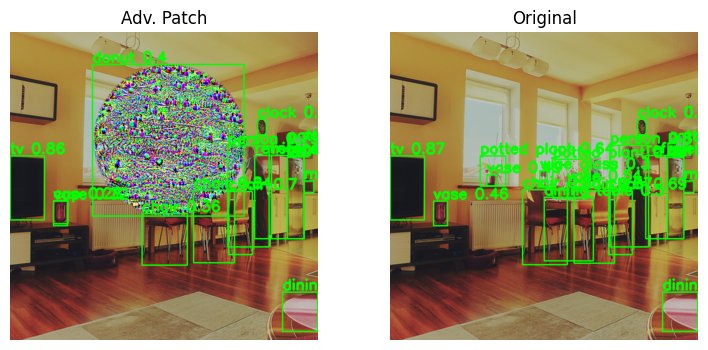

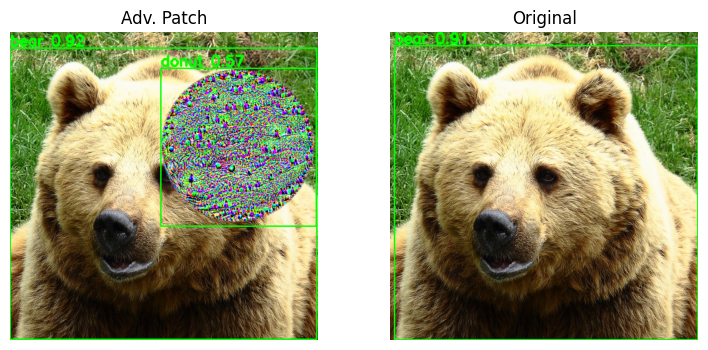

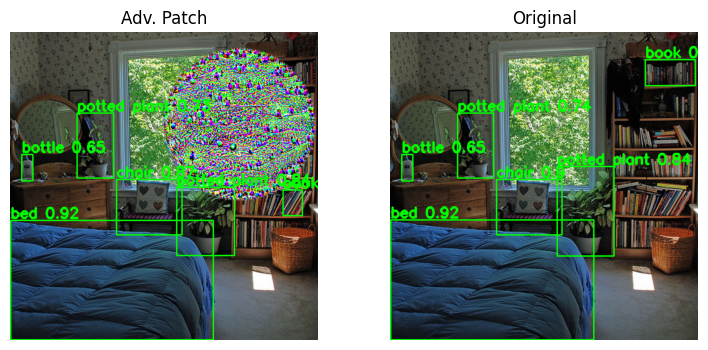

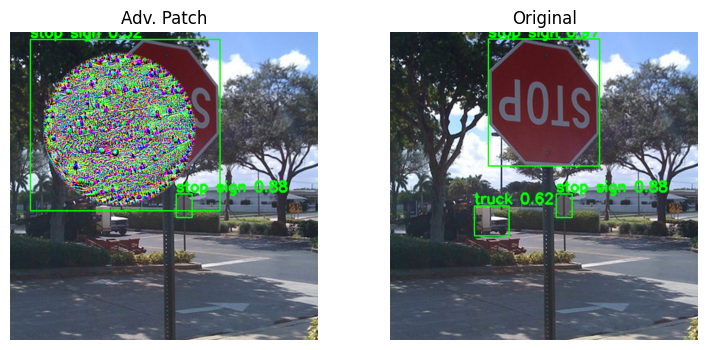

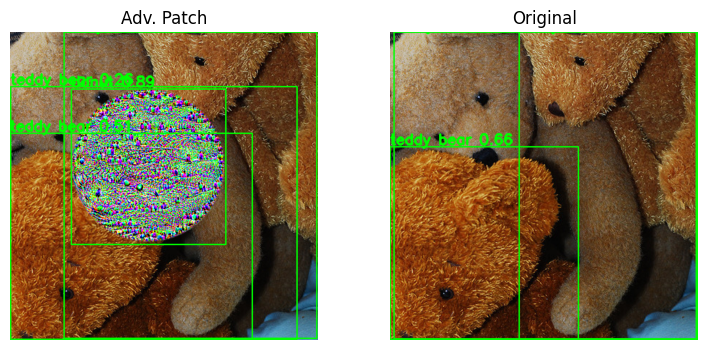

In [11]:
atk = AdversarialPatchPyTorch(estimator=detector,
                              targeted=False,
                              verbose=True)
transform = transforms.ToTensor()
atk._patch = transform(Image.open('adversarial_patch100.png'))
patched_images = atk.apply_patch(coco_images[:5], 0.5)
show_predictions(patched_images, coco_images, patch_title="Adv. Patch", model=detector.model)

### Вывод по Adv. Patch

Даже при большой величине патча, он почти не влияет на предсказания. Изменения обусловлены тем, что он физически закрывает часть изображения, а вот сам эффект от патча не заметен.

## DPatch

https://arxiv.org/abs/1806.02299

Данный вид атаки специально сделан для детекторов. Согласно статье, он должен стирать предсказания модели независимо от положения патча на изображении

Robust DPatch является модификацией обычного DPatch, которая должна быть более стойка к изменениям в изображении

### 100 итераций, размер 80х80

В статье показана эффективность и патча 40х40, а также сказано, что больший размер патча повышает эффективность

In [ ]:
atk = RobustDPatch(
    detector,
    patch_shape=(3, 80, 80),
    max_iter=100,
    batch_size=16
)
patch = atk.generate(x=coco_images)
save_patch(patch, 'dpatch100.png')

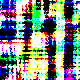

In [52]:
Image.open('dpatch100.png')

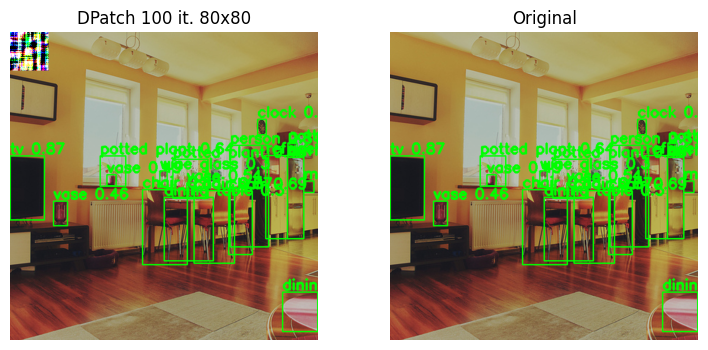

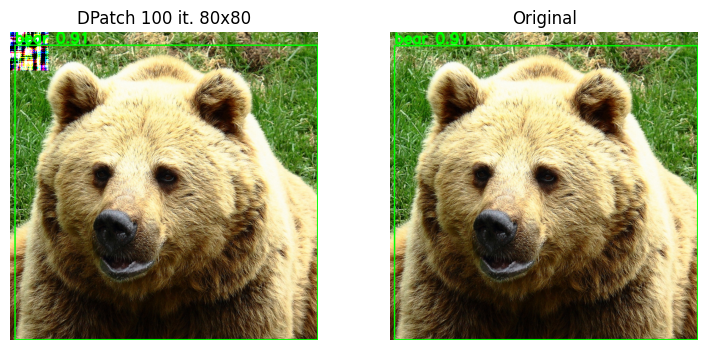

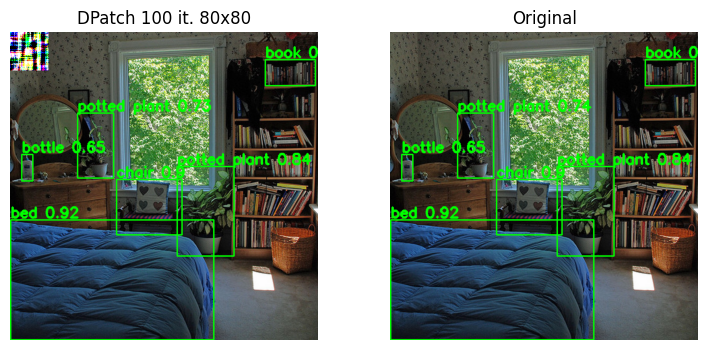

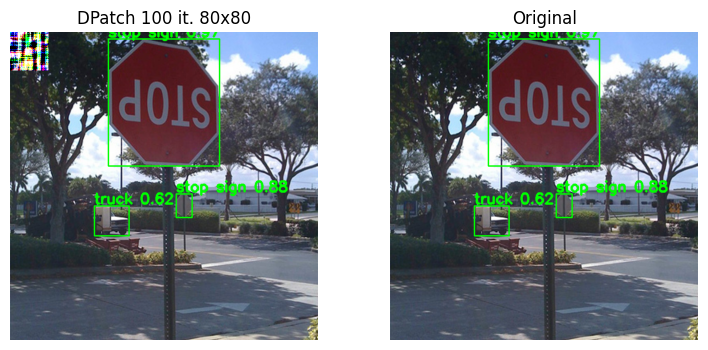

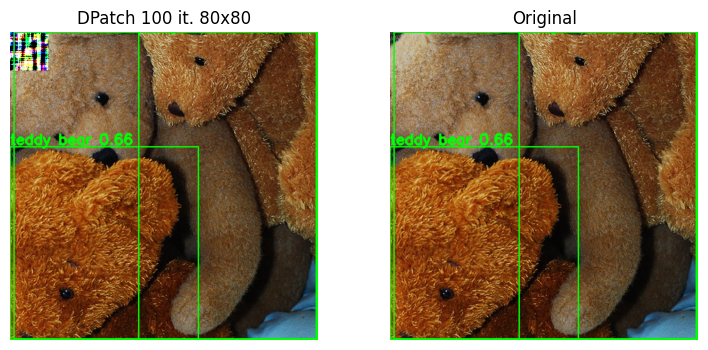

In [6]:
atk = RobustDPatch(
    detector,
    patch_shape=(3, 80, 80),
    max_iter=100,
    batch_size=16
)
transform = transforms.ToTensor()
atk._patch = transform(Image.open('dpatch100.png')).numpy()
patched_images = atk.apply_patch(coco_images[:5])
show_predictions(patched_images, coco_images, patch_title="DPatch 100 it. 80x80", model=detector.model)

### 500 итераций, размер 160х160

In [45]:
coco_images.shape

(10, 3, 416, 416)

In [49]:
onnx_runtime.get_inputs()[0].shape

[1, 3, 416, 416]

In [81]:
atk = RobustDPatch(
    detector,
    patch_shape=(3, 160, 160),
    max_iter=5000,
    batch_size=1
)
patch = atk.generate(x=coco_images)
save_patch(patch, 'dpatch5000.png')

RobustDPatch iteration:   0%|          | 0/5000 [00:00<?, ?it/s]

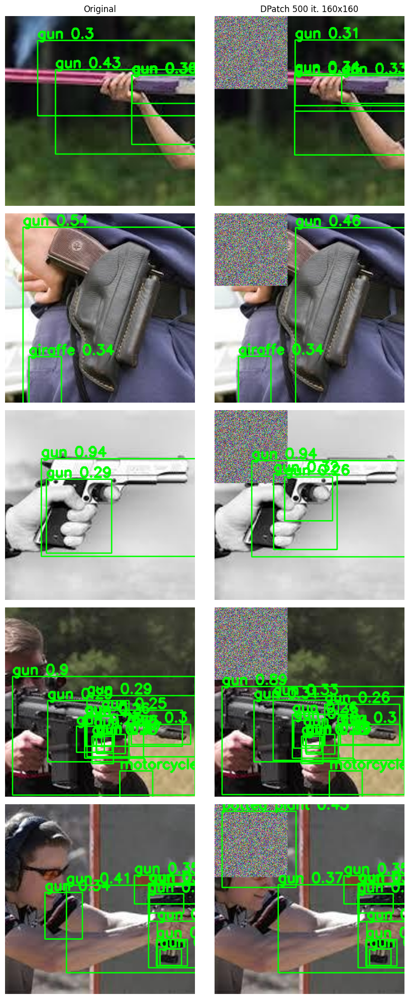

In [22]:
atk = RobustDPatch(
    detector,
    patch_shape=(3, 160, 160),
    max_iter=500,
    batch_size=16
)
COCO_INSTANCE_CATEGORY_NAMES[0] = 'gun'
transform = transforms.ToTensor()
atk._patch = transform(Image.open('dpatch500.png')).numpy()
imgs = coco_images[15:20]
patched_images = atk.apply_patch(imgs)
show_predictions(patched_images, imgs, patch_title="DPatch 500 it. 160x160", model=detector, filename='test_dpatch_500.png')

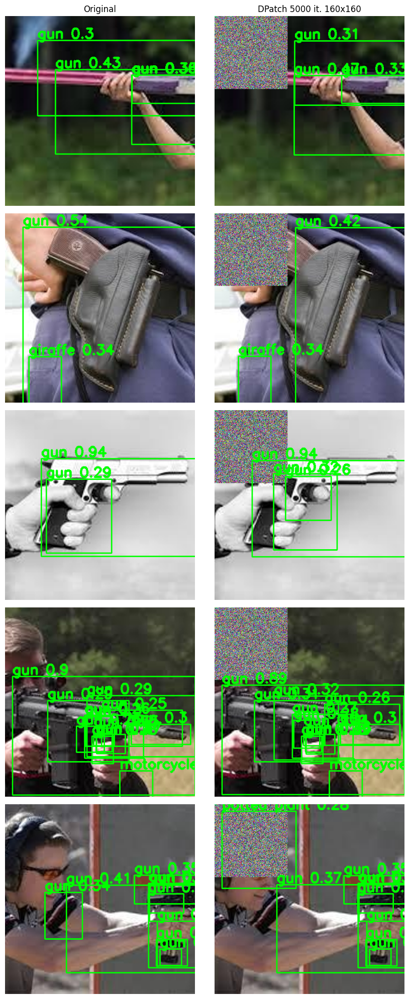

In [24]:
atk = RobustDPatch(
    detector,
    patch_shape=(3, 160, 160),
    max_iter=5000,
    batch_size=16
)
COCO_INSTANCE_CATEGORY_NAMES[0] = 'gun'
transform = transforms.ToTensor()
atk._patch = transform(Image.open('dpatch5000.png')).numpy()
imgs = coco_images[15:20]
patched_images = atk.apply_patch(imgs)
show_predictions(patched_images, imgs, patch_title="DPatch 5000 it. 160x160", model=detector, filename='test_dpatch_5000.png')

0 влияния патча на предсказания

Подвигаем патч и посмотрим, точно ли его положение не влияет на предсказания модели

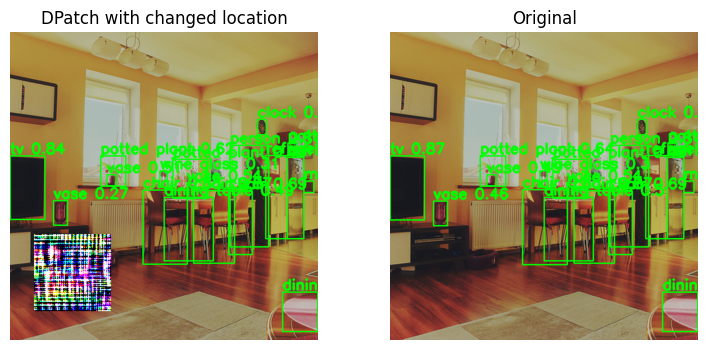

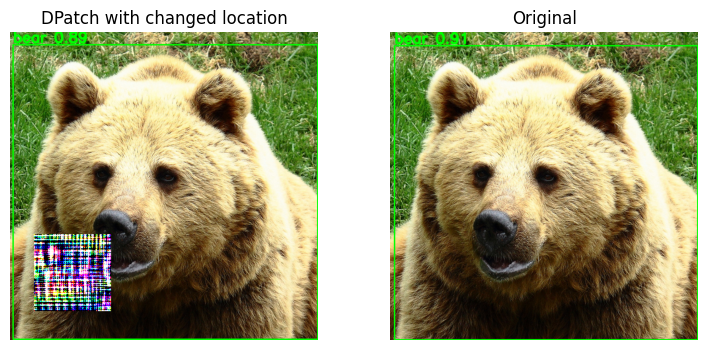

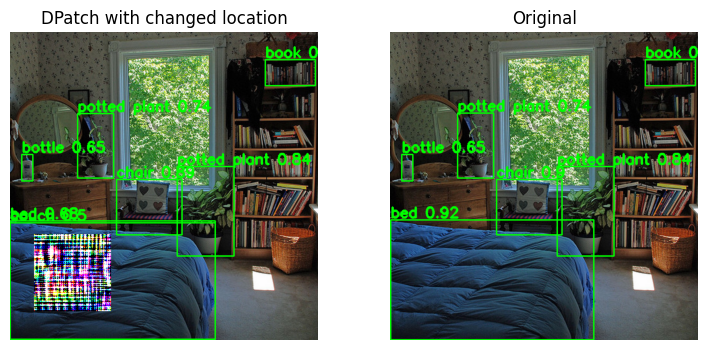

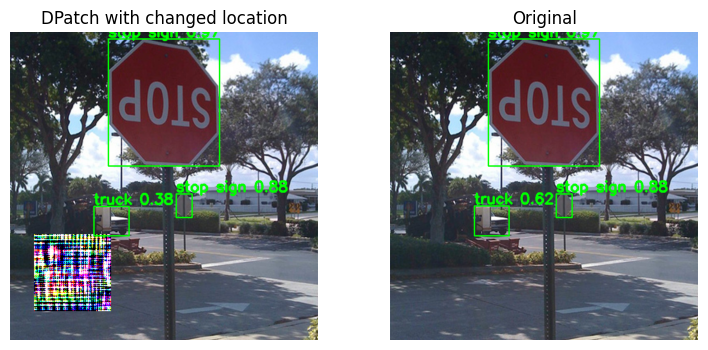

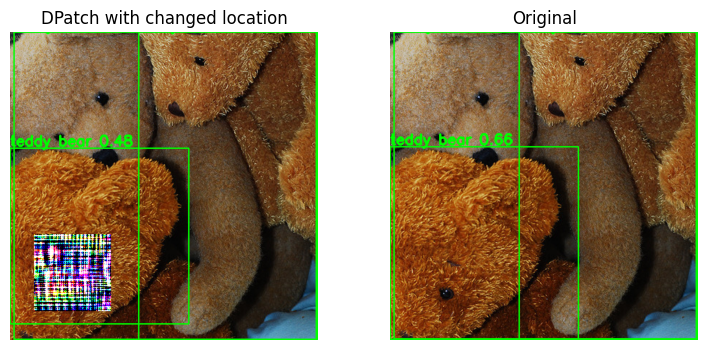

In [9]:
atk.patch_location = (420, 50)
patched_images = atk.apply_patch(coco_images[:5])
show_predictions(patched_images, coco_images, patch_title="DPatch with changed location", model=detector.model)

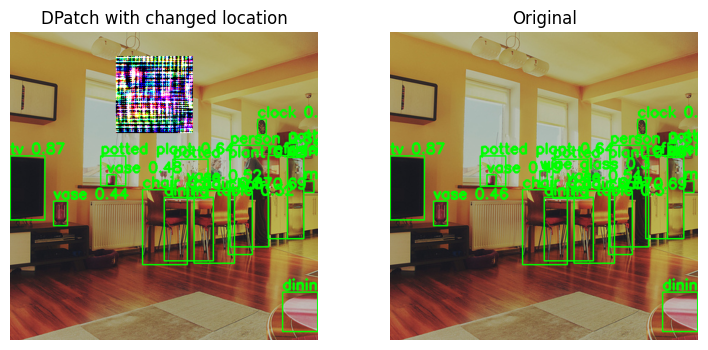

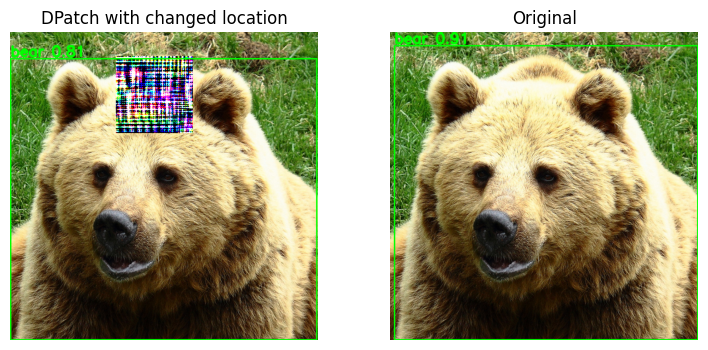

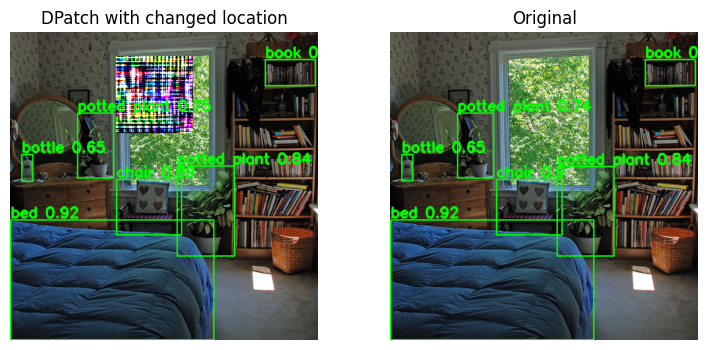

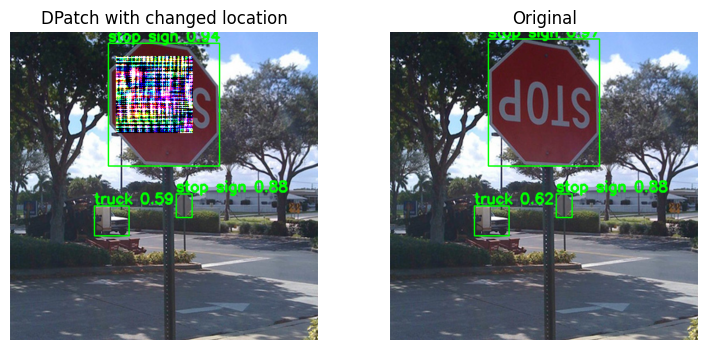

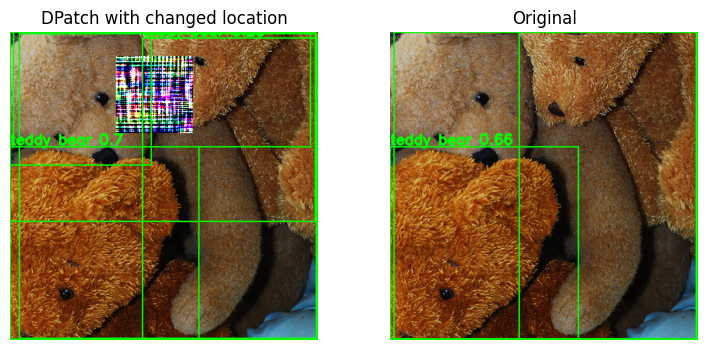

In [16]:
atk.patch_location = (50, 220)
patched_images = atk.apply_patch(coco_images[:5])
show_predictions(patched_images, coco_images, patch_title="DPatch with changed location", model=detector.model)

Модель нашими попытками всё ещё не впечатлена

# Вывод

Представленные в ART методы генерации патчей являются неэффективными для YOLOv8. Скорее всего это связано с тем, что представленные здесь Adversarial Patch и DPatch создавались для намного более ранних моделей YOLO, и изменения в структуре более новых моделей делает их устойчивее к таким видам атак